# Santé 


Peut-on établir un lien entre la densité de médecins par spécialité  et par territoire et la pratique du dépassement d'honoraires ? Est-ce  dans les territoires où la densité est la plus forte que les médecins  pratiquent le moins les dépassement d'honoraires ? Est ce que la densité de certains médecins / praticiens est corrélé à la densité de population pour certaines classes d'ages (bebe/pediatre, personnes agées / infirmiers etc...) ?


Mots clés : OpenDamir , pandas chunck, Dask DataFrame ,slugify

In [30]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

############ suppression des warnings ###############

import warnings
warnings.filterwarnings('ignore')


########### on fixe le seeed #####################
import random

random.seed(12345)



################### chargement de la base des spécialiste ################
url_spec="specialistes.csv"
df_spec=pd.read_csv(url_spec,sep=",",na_values=['nc'],thousands=',')
df_spec.columns=['spec','dpt','eff','hono_sansdepass','depass','frais_depl','total_hono']
df_spec.head()

,spec,dpt,eff,hono_sansdepass,depass,frais_depl,total_hono
0,02- Anesthésie-réanimation chirurgicale,01- Ain,17,4530079.0,2496180.0,0.0,7026260.0
1,02- Anesthésie-réanimation chirurgicale,02- Aisne,19,4985260.0,373838.0,0.0,5359097.0
2,02- Anesthésie-réanimation chirurgicale,03- Allier,19,5102902.0,560979.0,0.0,5663880.0
3,02- Anesthésie-réanimation chirurgicale,04- Alpes-Hte-Provence,4,NaN,NaN,NaN,NaN
4,02- Anesthésie-réanimation chirurgicale,05- Hautes-Alpes,5,NaN,NaN,NaN,NaN


### Traitement du fichier des spécialisations

In [31]:
regdpt='(\d+)'
regspec='(TOTAL)'
filter_spec_dpt=list(map(lambda x,y : x and y , df_spec.spec.str.contains(regspec),df_spec.dpt.str.contains(regdpt)))

df_treated=df_spec[filter_spec_dpt]
df_treated['codedpt']=df_treated.dpt.str.extract(regdpt)
df_treated.dropna(subset=['codedpt']) 
df_treated.head()

spec_dict = {'TOTAL ANESTHESIE REANIMATION  (02, 20)': "ANESTHESIE_REANIMATION",
      'TOTAL CHIRURGIE  (43, 44, 46, 47, 48, 49, 04)': "CHIRURGIE",
     'TOTAL RADIOLOGIE  (72, 74, 76, 06)':"RADIOLOGIE",
     'TOTAL GYNECOLOGIE  (70, 77, 79, 07)':"GYNECOLOGIE",
     'TOTAL MEDECINE INTERNE  (71, 73, 09)':"MEDECINE_INTERNE",
     'TOTAL PEDIATRIE  (78, 12)':"PEDIATRIE",
     'TOTAL STOMATOLOGIE  (45, 18)':"STOMATOLOGIE",
     'TOTAL PSYCHIATRIE  (75, 33)':"PSYCHIATRIE",
     'TOTAL SPECIALISTES':"total_specialiste",
     'TOTAL MEDECINS':"total_medecins"}

df_treated=df_treated.replace({"spec": spec_dict})
df_treated.head()


,spec,dpt,eff,hono_sansdepass,depass,frais_depl,total_hono,codedpt
208,ANESTHESIE_REANIMATION,01- Ain,17,4530079.0,2496180.0,0.0,7026260.0,01
209,ANESTHESIE_REANIMATION,02- Aisne,19,4985260.0,373838.0,0.0,5359097.0,02
210,ANESTHESIE_REANIMATION,03- Allier,19,5102902.0,560979.0,0.0,5663880.0,03
211,ANESTHESIE_REANIMATION,04- Alpes-Hte-Provence,4,NaN,NaN,NaN,NaN,04
212,ANESTHESIE_REANIMATION,05- Hautes-Alpes,5,NaN,NaN,NaN,NaN,05


In [48]:
############ pivoter les tableau afin d'avoir toutes les variables en colonnes ##############
def pivot_df ( df, colmn, value) : 
    df_pivot=pd.pivot_table(df[['eff','codedpt','hono_sansdepass','depass','total_hono','spec']],index=['codedpt'],columns=colmn, values=value)
    df_pivot=pd.DataFrame(df_pivot.to_records())
    df_pivot.columns = treat_col(df_pivot.columns)
    return df_pivot

def treat_col (cols):
    return  [col.replace("(","").replace(",","_").replace(")", "").replace("'", "").replace('\n','') \
                     for col in cols]


df_eff=pivot_df (df_treated, colmn=['spec'], value=['eff'])
df_depass=pivot_df (df_treated, colmn=['spec'], value=['depass'])

print(df_eff.columns)
print(df_depass.columns)

###########  on merge les données des effectifs des medecins & dépassement ##############
df_depass_eff = pd.merge(df_eff, df_depass,
                       how='left', on=['codedpt'])
df_depass_eff

Index(['codedpt', 'eff_ ANESTHESIE_REANIMATION', 'eff_ CHIRURGIE',
       'eff_ GYNECOLOGIE', 'eff_ MEDECINE_INTERNE', 'eff_ PEDIATRIE',
       'eff_ PSYCHIATRIE', 'eff_ RADIOLOGIE', 'eff_ STOMATOLOGIE',
       'eff_ total_medecins', 'eff_ total_specialiste'],
      dtype='object')
Index(['codedpt', 'depass_ ANESTHESIE_REANIMATION', 'depass_ CHIRURGIE',
       'depass_ GYNECOLOGIE', 'depass_ MEDECINE_INTERNE', 'depass_ PEDIATRIE',
       'depass_ PSYCHIATRIE', 'depass_ RADIOLOGIE', 'depass_ STOMATOLOGIE',
       'depass_ total_medecins', 'depass_ total_specialiste'],
      dtype='object')


,codedpt,eff_ ANESTHESIE_REANIMATION,eff_ CHIRURGIE,eff_ GYNECOLOGIE,eff_ MEDECINE_INTERNE,eff_ PEDIATRIE,eff_ PSYCHIATRIE,eff_ RADIOLOGIE,eff_ STOMATOLOGIE,eff_ total_medecins,...,depass_ ANESTHESIE_REANIMATION,depass_ CHIRURGIE,depass_ GYNECOLOGIE,depass_ MEDECINE_INTERNE,depass_ PEDIATRIE,depass_ PSYCHIATRIE,depass_ RADIOLOGIE,depass_ STOMATOLOGIE,depass_ total_medecins,depass_ total_specialiste
0,01,17.0,13.0,19.0,0.0,12.0,12.0,41.0,4.0,681.0,...,2496180.0,1001804.0,1228214.0,0.0,152737.0,113494.0,2379551.0,NaN,14687308.0,13513415.0
1,02,19.0,10.0,34.0,6.0,15.0,22.0,34.0,3.0,682.0,...,373838.0,NaN,483779.0,NaN,79509.0,235659.0,86972.0,NaN,6288185.0,5281798.0
2,03,19.0,13.0,17.0,1.0,1.0,13.0,33.0,2.0,529.0,...,560979.0,682900.0,345015.0,NaN,NaN,90148.0,4291.0,NaN,6316051.0,6024150.0
3,04,4.0,2.0,9.0,2.0,6.0,8.0,9.0,1.0,294.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2577950.0,2145420.0
4,05,5.0,6.0,5.0,2.0,2.0,5.0,10.0,0.0,277.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1190269.0,887997.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,971,11.0,15.0,30.0,0.0,22.0,8.0,33.0,3.0,588.0,...,36477.0,387882.0,313093.0,0.0,88809.0,NaN,412731.0,NaN,5067811.0,4357127.0
96,972,11.0,15.0,23.0,1.0,14.0,8.0,26.0,3.0,510.0,...,1275073.0,958973.0,704982.0,NaN,208382.0,NaN,665104.0,NaN,8627097.0,7908302.0
97,973,2.0,5.0,14.0,0.0,2.0,2.0,6.0,0.0,166.0,...,NaN,NaN,87748.0,0.0,NaN,NaN,NaN,0.0,892825.0,810250.0
98,974,31.0,25.0,55.0,3.0,34.0,34.0,66.0,10.0,1328.0,...,178734.0,1169808.0,1445853.0,NaN,90101.0,510976.0,74451.0,NaN,8120504.0,7897460.0


### Traitement du fichier de recensement  ( uniquement l'age )

In [52]:

def converttofloat(x):
    return float(x.replace(',',''))

dfpop=pd.read_csv("pop.csv",sep=",",skiprows=4,thousands=',')

listvarage=list(dfpop.columns)[0:list(dfpop.columns).index('Total')+1] ## ne pas tenir compte du texte 
df_pop=dfpop[listvarage]
df_pop.columns=['codedpt','dpt']+['tr'+str(i) for i in range(1,21)]+['total']
df_pop["bebe"]=df_pop['tr1']
df_pop["enfant"]= df_pop[['tr2','tr3']].sum(axis=1)
df_pop["jeune"]= df_pop[['tr4','tr5','tr6']].sum(axis=1)
df_pop["adulte"]= df_pop[['tr7','tr8','tr9','tr10','tr11']].sum(axis=1)
df_pop["adulte2"]= df_pop[['tr12','tr13']].sum(axis=1)
df_pop["agees"]= df_pop[['tr14','tr15','tr16','tr17','tr18','tr20']].sum(axis=1)


df_pop=df_pop.dropna()  ## on drop les NaNs (...)
df_pop.head()


,codedpt,dpt,tr1,tr2,tr3,tr4,tr5,tr6,tr7,tr8,...,tr18,tr19,tr20,total,bebe,enfant,jeune,adulte,adulte2,agees
0,01,Ain,39022.0,44668.0,45115.0,39527.0,29945.0,35001.0,41101.0,43989.0,...,11333.0,5473.0,1574.0,649654.0,39022.0,89783.0,104473.0,222535.0,79144.0,109224.0
1,02,Aisne,30704.0,34774.0,35380.0,33722.0,24914.0,28299.0,30813.0,31978.0,...,10915.0,4972.0,1140.0,534286.0,30704.0,70154.0,86935.0,167460.0,71842.0,102219.0
2,03,Allier,15316.0,17665.0,18982.0,18402.0,14304.0,15624.0,16395.0,17927.0,...,10110.0,4594.0,1252.0,338978.0,15316.0,36647.0,48330.0,99909.0,48350.0,85832.0
3,04,Alpes-de-Haute-Provence,7625.0,8639.0,9304.0,8677.0,6054.0,7004.0,8201.0,8638.0,...,4265.0,2058.0,660.0,161664.0,7625.0,17943.0,21735.0,48148.0,23867.0,40288.0
4,05,Hautes-Alpes,6827.0,8188.0,8496.0,7548.0,5804.0,6758.0,7565.0,8736.0,...,3388.0,1541.0,626.0,141576.0,6827.0,16684.0,20110.0,44903.0,20177.0,31334.0


### Merge le fichier de recensement avec le fichier de dépassement  ###

In [53]:
### merge recencement ##
df_rec_depass = pd.merge(df_depass_eff ,df_pop,how='left', on=['codedpt'])
print(list(spec_dict.values()))
print(list(map(lambda x:"eff_"+x ,list(spec_dict.values()) )))

df_rec_depass.head()

['ANESTHESIE_REANIMATION', 'CHIRURGIE', 'RADIOLOGIE', 'GYNECOLOGIE', 'MEDECINE_INTERNE', 'PEDIATRIE', 'STOMATOLOGIE', 'PSYCHIATRIE', 'total_specialiste', 'total_medecins']
['eff_ANESTHESIE_REANIMATION', 'eff_CHIRURGIE', 'eff_RADIOLOGIE', 'eff_GYNECOLOGIE', 'eff_MEDECINE_INTERNE', 'eff_PEDIATRIE', 'eff_STOMATOLOGIE', 'eff_PSYCHIATRIE', 'eff_total_specialiste', 'eff_total_medecins']


,codedpt,eff_ ANESTHESIE_REANIMATION,eff_ CHIRURGIE,eff_ GYNECOLOGIE,eff_ MEDECINE_INTERNE,eff_ PEDIATRIE,eff_ PSYCHIATRIE,eff_ RADIOLOGIE,eff_ STOMATOLOGIE,eff_ total_medecins,...,tr18,tr19,tr20,total,bebe,enfant,jeune,adulte,adulte2,agees
0,01,17.0,13.0,19.0,0.0,12.0,12.0,41.0,4.0,681.0,...,11333.0,5473.0,1574.0,649654.0,39022.0,89783.0,104473.0,222535.0,79144.0,109224.0
1,02,19.0,10.0,34.0,6.0,15.0,22.0,34.0,3.0,682.0,...,10915.0,4972.0,1140.0,534286.0,30704.0,70154.0,86935.0,167460.0,71842.0,102219.0
2,03,19.0,13.0,17.0,1.0,1.0,13.0,33.0,2.0,529.0,...,10110.0,4594.0,1252.0,338978.0,15316.0,36647.0,48330.0,99909.0,48350.0,85832.0
3,04,4.0,2.0,9.0,2.0,6.0,8.0,9.0,1.0,294.0,...,4265.0,2058.0,660.0,161664.0,7625.0,17943.0,21735.0,48148.0,23867.0,40288.0
4,05,5.0,6.0,5.0,2.0,2.0,5.0,10.0,0.0,277.0,...,3388.0,1541.0,626.0,141576.0,6827.0,16684.0,20110.0,44903.0,20177.0,31334.0


### Correlation entre les tranches d'age et les effectifs des medecins ###

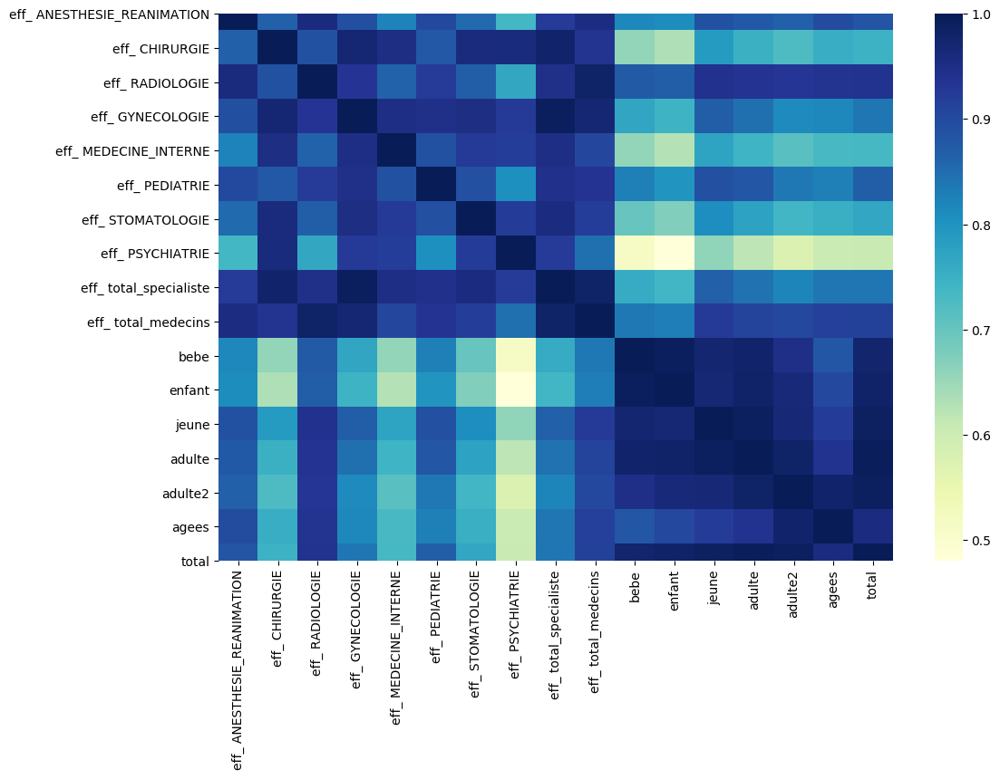

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns
# Matrice de covariance

selected_var=list(map(lambda x:"eff_ "+x ,list(spec_dict.values()) ))+['bebe','enfant','jeune','adulte','adulte2','agees','total']
df_rec_depass_cov = df_rec_depass[selected_var].corr()

%matplotlib inline
# Graphe illustrant l'allure de la matrice des covariance
plt.figure(figsize=(12,8), dpi=100)
sns.heatmap(df_rec_depass_cov,cmap="YlGnBu")
plt.show()

On voit que 

### dépassement et effectif des médecins ##

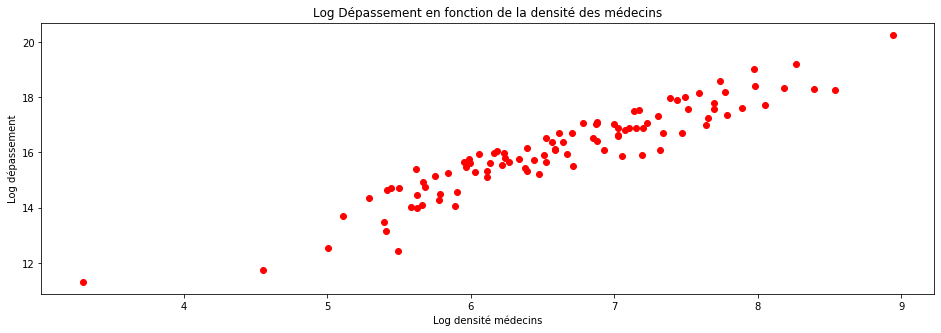

In [69]:
df_geo=df_treated[df_treated.spec=='total_medecins']

plt.figure(figsize=(16,5))
plt.title('Log Dépassement en fonction de la densité des médecins')
plt.xlabel('Log densité médecins')
plt.ylabel('Log dépassement')

plt.scatter(np.log(df_geo['eff']),np.log(df_geo['depass']) ,color='red')

### Coefficient de dépassement [total medecins] par départment ###

In [70]:
import folium
df_geo=df_treated[df_treated.spec=='total_medecins']
df_geo['coef_depass']=df_geo['depass']/(0.001*df_geo['depass'].mean()*df_geo['eff'])
dpt_geo = r'departements.geojson' # geojson file


## fonction qui génère une carte par département pour une colonne donnée
def display_map (dfmap,colcible ,color,countrylocation=[47, 2.3]): 
    dpt_map = folium.Map(countrylocation, zoom_start=6, tiles='Mapbox Bright')
    # generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
    dpt_map.choropleth(
        geo_data=dpt_geo,
        data=dfmap,
        columns=['codedpt',colcible],
        key_on='feature.properties.code',
        fill_color=color, 
        fill_opacity=0.7, 
        line_opacity=0.2,
        legend_name=colcible+'/effectif'
    )
    return dpt_map

# une carte par département pour la variable coef_depass
dpt_depass=display_map(df_geo,'coef_depass',countrylocation=[47, 2.3],color='YlOrRd')
dpt_depass  



La concentration de dépassement par effectif est surtout en ile de france , Lyon
En deuxième orde , il y a nice et strasbourg

### Maintenant on veut afficher la carte pour quelques spécialités ###
Pour ce faire , on va exploiter la base construite en amont "df_depass_eff"

#####  1-Pédiatrie

In [71]:
%matplotlib inline

df_depass_eff['coef_depass_pediatrie']=df_depass_eff['depass_ PEDIATRIE']/(0.001*df_depass_eff['depass_ PEDIATRIE'].mean()*df_depass_eff['eff_ PEDIATRIE'])
dpt_depass_pediatrie=display_map(df_depass_eff,'coef_depass_pediatrie',countrylocation=[47, 2.3],color='YlGnBu')
dpt_depass_pediatrie 



#####  2-Psychiatrie

In [72]:
df_depass_eff['coef_depass_PSYCHIATRIE']=df_depass_eff['depass_ PSYCHIATRIE']/(0.001*df_depass_eff['depass_ PSYCHIATRIE'].mean()*df_depass_eff['eff_ PSYCHIATRIE'])

dpt_depass_PSYCHIATRIE=display_map(df_depass_eff,'coef_depass_PSYCHIATRIE',countrylocation=[47, 2.3],color='YlOrRd')
dpt_depass_PSYCHIATRIE


In [73]:
df_depass_eff.columns

Index(['codedpt', 'eff_ ANESTHESIE_REANIMATION', 'eff_ CHIRURGIE',
       'eff_ GYNECOLOGIE', 'eff_ MEDECINE_INTERNE', 'eff_ PEDIATRIE',
       'eff_ PSYCHIATRIE', 'eff_ RADIOLOGIE', 'eff_ STOMATOLOGIE',
       'eff_ total_medecins', 'eff_ total_specialiste',
       'depass_ ANESTHESIE_REANIMATION', 'depass_ CHIRURGIE',
       'depass_ GYNECOLOGIE', 'depass_ MEDECINE_INTERNE', 'depass_ PEDIATRIE',
       'depass_ PSYCHIATRIE', 'depass_ RADIOLOGIE', 'depass_ STOMATOLOGIE',
       'depass_ total_medecins', 'depass_ total_specialiste',
       'coef_depass_pediatrie', 'coef_depass_PSYCHIATRIE'],
      dtype='object')